In [1]:
import numpy as np
from obspy import read_events
from obspy import read_inventory
from obspy.clients.fdsn import Client
client_wm = Client("IRIS")
from obspy.clients.iris import Client  
from obspy.taup import TauPyModel
from obspy import Stream, Trace
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
from obspy import UTCDateTime
import matplotlib.pyplot as plt
from obspy.geodetics import locations2degrees,degrees2kilometers
from scipy import signal
plt.rc('font', size=10) 
%matplotlib widget
import datetime
from obspy.signal.trigger import recursive_sta_lta,plot_trigger,coincidence_trigger
import pandas as pd

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

/Users/yuantian/anaconda3/envs/obspy/lib/python3.7/site-packages/obspy/imaging/maps.py:388: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  width=width, height=height, ax=ax)
/Users/yuantian/anaconda3/envs/obspy/lib/python3.7/site-packages/obspy/imaging/maps.py:439: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  bmap.drawcountries(color="0.75")


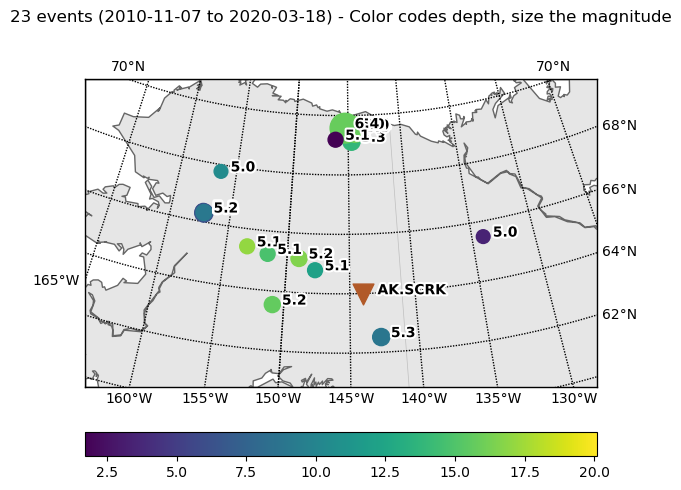

In [4]:
evid_dum='https://earthquake.usgs.gov/fdsnws/event/1/query?&starttime=2010-09-01&endtime=2020-9-01&minmagnitude=5&maxdepth=50&latitude=67&longitude=-145&maxradius=5'
inv0 = client_wm.get_stations(
    channel="BH*", starttime=UTCDateTime(2020,9,1,0,0,0),endtime=UTCDateTime(2020,10,1,0,0,0),
    network="AK", sta="SCRK",
    level="response")
#inv0 = client_wm.get_stations(channel="BH*", starttime=UTCDateTime(2020,9,1,0,0,0),endtime=UTCDateTime(2020,10,1,0,0,0), latitude=64,level="channel", longitude=-143, maxradius=1) 
cat0 = read_events(evid_dum)

fig=cat0.plot(projection='local',method="basemap")
inv0.plot(projection='local',method="basemap", fig=fig)

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

/Users/yuantian/anaconda3/envs/obspy/lib/python3.7/site-packages/obspy/imaging/maps.py:388: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  width=width, height=height, ax=ax)
/Users/yuantian/anaconda3/envs/obspy/lib/python3.7/site-packages/obspy/imaging/maps.py:439: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  bmap.drawcountries(color="0.75")


Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

/Users/yuantian/anaconda3/envs/obspy/lib/python3.7/site-packages/obspy/imaging/maps.py:344: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  ax=ax)
/Users/yuantian/anaconda3/envs/obspy/lib/python3.7/site-packages/obspy/imaging/maps.py:439: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  bmap.drawcountries(color="0.75")


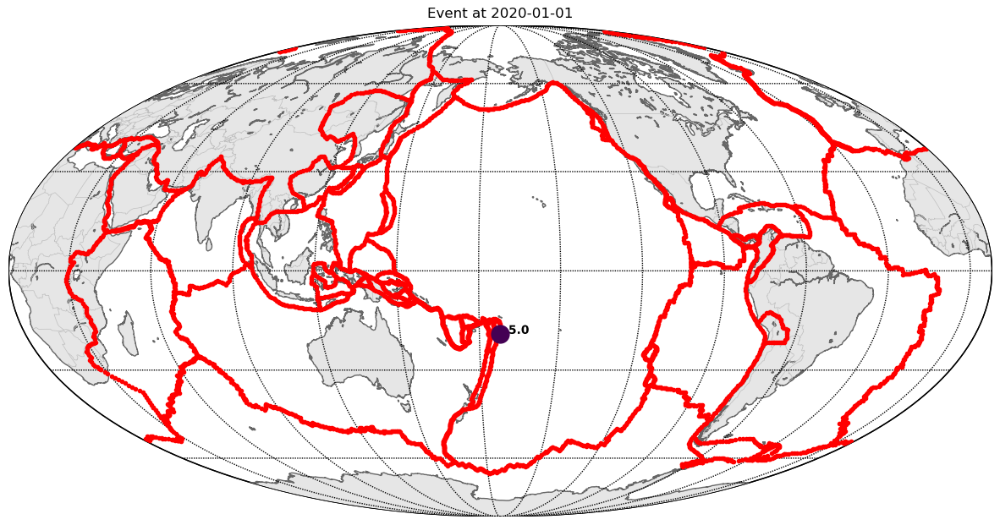

In [8]:
evid_dum='https://earthquake.usgs.gov/fdsnws/event/1/query?&starttime=2010-01-01&endtime=2020-01-02&maxmagnitude=10&minmagnitude=5'
#sta_url='http://service.iris.edu/fdsnws/station/1/query?latitude=64&longitude=-150&maxradius=0.5'
#inv0 = read_inventory(sta_url)
#inv0 = client_wm.get_stations(channel="BH*", starttime=UTCDateTime(2000, 1, 1),endtime=UTCDateTime(2019, 1, 1, 0, 5), latitude=67,level="channel", longitude=-150, maxradius=1) 
cat0 = read_events(evid_dum)
fig=cat0.plot(projection='local',method="basemap")
fig.set_size_inches(14,7)
fig
boundary_fh=open('PB2002_boundaries.dig.txt')
bddt_lines=list(boundary_fh)
fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 10))
#fig=cat0.plot(projection='local',method="basemap",fig=ax)
fig=cat0[0:1].plot(method="basemap",fig=ax)
boundarys=[]
boundarysx=[]
boundarysy=[]
boundaryslon=[]
boundaryslat=[]
for line in bddt_lines:
    #line = line.rstrip()
    #print(line)
    
    if not line.startswith('*'):
        try:
            lonn=float(line[0:13])
            latn=float(line[14:-1])
            boundary.append([lonn,latn])
            boundaryslon.append(lonn)
            boundaryslat.append(latn)
            x,y=fig.bmap(lonn,latn)
            boundaryx.append(x)
            boundaryy.append(y)
        except:
            boundary=[]
            boundaryx=[]
            boundaryy=[]
            continue
    else:
        boundarys.append(boundary)
        boundarysx.append(boundaryx)
        boundarysy.append(boundaryy)
for i in range(0,229):
    fig.bmap.plot(boundarysx[i],boundarysy[i],'r.')
fig

Canvas(toolbar=Toolbar(toolitems=[('Home', 'Reset original view', 'home', 'home'), ('Back', 'Back to previous …

/Users/yuantian/anaconda3/envs/obspy/lib/python3.7/site-packages/obspy/imaging/maps.py:344: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  ax=ax)
/Users/yuantian/anaconda3/envs/obspy/lib/python3.7/site-packages/obspy/imaging/maps.py:439: MatplotlibDeprecationWarning: 
The dedent function was deprecated in Matplotlib 3.1 and will be removed in 3.3. Use inspect.cleandoc instead.
  bmap.drawcountries(color="0.75")


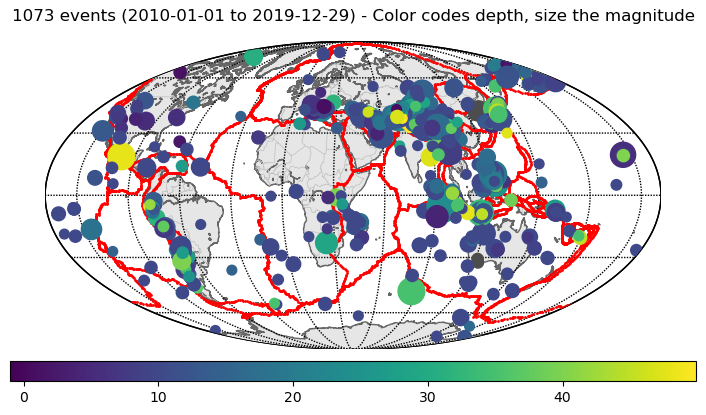

In [14]:

min_dis_deg=2
n=0
for i in range(len(cat0)):
#for i in range(1):
    cat_dum=cat0[i:i+1]
    dis=locations2degrees(cat_dum[0].origins[0].latitude, cat_dum[0].origins[0].longitude, boundaryslat, boundaryslon)
    mindis=np.min(dis)
    if mindis>min_dis_deg and cat_dum[0].origins[0].depth<50000:
        n=n+1
        if n==1:
            cat_sel=cat_dum
        else:
            cat_sel+=cat_dum
#fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(15, 10))
fig=cat_sel.plot(method="basemap")
fig.set_size_inches(7,4)
boundarysx=[]
boundarysy=[]
for line in bddt_lines:
    #line = line.rstrip()
    #print(line)
    
    if not line.startswith('*'):
        try:
            lonn=float(line[0:13])
            latn=float(line[14:-1])
            x,y=fig.bmap(lonn,latn)
            boundaryx.append(x)
            boundaryy.append(y)
        except:
            #boundary=[]
            boundaryx=[]
            boundaryy=[]
            continue
    else:
        boundarysx.append(boundaryx)
        boundarysy.append(boundaryy)
for i in range(0,229):
    fig.bmap.plot(boundarysx[i],boundarysy[i],'r.',ms=2)
fig

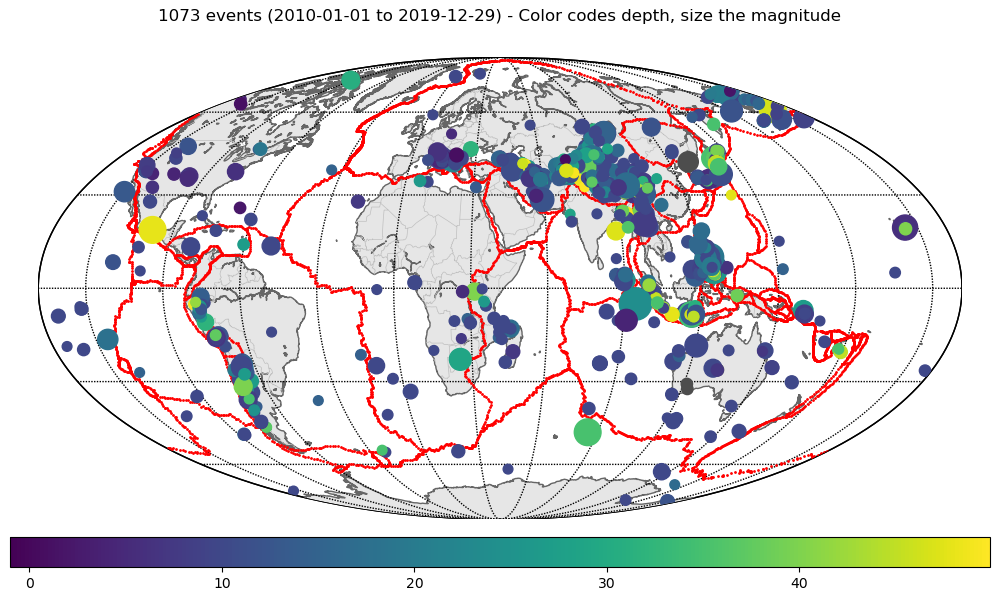

In [12]:
fig